In [2]:
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt

In [7]:
df = pd.read_csv(r"C:\Users\MSI\Desktop\НИС\nis-network\Data\data_merged_2006-2022.csv")
df.head()

,Year,Donor Name,CBPF Name,Paid Amount,Pledged Amount,Total Contributions,Local Curency,Exchange Rate,Paid Amount (Local Currency),Pledged Amount (Local Currency),Total Contributions (Local Currency)
0,2006,Netherlands,Ethiopia,5012000.0,0.0,5012000.0,USD,1.00,5012000.00,0,5012000.00
1,2006,Norway,Ethiopia,1553277.0,0.0,1553277.0,USD,1.00,1553277.00,0,1553277.00
2,2006,Switzerland,Ethiopia,247934.0,0.0,247934.0,CHF,1.21,300000.14,0,300000.14
3,2006,United Kingdom,Ethiopia,8861284.0,0.0,8861284.0,GBP,0.56,5000000.20,0,5000000.20
4,2007,Netherlands,Ethiopia,3395940.0,0.0,3395940.0,USD,1.00,3395940.00,0,3395940.00


In [8]:
print(df['Donor Name'].unique())
print()
print(df['CBPF Name'].unique())

['Netherlands' 'Norway' 'Switzerland' 'United Kingdom' 'Spain' 'Sweden'
 'Ireland' 'Italy' 'Belgium' 'Denmark' 'Luxembourg' 'Afghanistan'
 'Algeria' 'Andorra' 'Armenia' 'Australia' 'Azerbaijan' 'Benin' 'Botswana'
 'Brazil' 'Brunei Darussalam' 'Burundi' 'Cambodia' 'Chile'
 'Congo, Republic of' 'Equatorial Guinea' 'Finland' 'France' 'Gabon'
 'India' 'Indonesia' 'Kazakhstan' 'Kenya' 'Macedonia' 'Madagascar' 'Malta'
 'Moldova' 'Mongolia' 'New Zealand' 'Nigeria' 'PRIVATE SECTOR'
 'Saudi Arabia' 'Sierra Leone' 'Slovenia' 'Tunisia' 'Uganda'
 'UN and Other Agencies' 'Viet Nam' 'Guyana' 'Montenegro' 'Poland'
 'San Marino' 'Germany' 'Korea, Republic of' 'African Union' 'Iceland'
 'Canada' 'Qatar' 'UNOCHA' 'Kuwait' 'Malaysia' 'Cyprus' 'Jersey'
 'United States' 'AGFUND' 'Lithuania' 'Sri Lanka' 'Turkey' 'Colombia'
 'Philippines' 'Portugal' 'Private donations (through UNF)'
 'United Arab Emirates' 'Czech Republic' 'Estonia' 'Japan' 'Monaco'
 'Ukraine' 'Bulgaria' 'European Commission' 'Greece' 'Slova

**Расшифровки аббревиатур:**

1. CBPF - Country-based Pooled Funds
2. oPt - Occupied Palestinian Territory
3. CAR - Central African Republic
4. DRC - Democratic Republic of the Congo
5. RhPF - Regionally-hosted Pooled Fund
6. UNF - United Nations Foundation
7. AGFUND - Arab Gulf Programme for Development
8. UNOCHA - United Nations Office for the Coordination of Humanitarian Affairs
9. UN - United Nations

In [9]:
df = df[['Year', 'Donor Name', 'CBPF Name', 'Paid Amount']]
df.head()

,Year,Donor Name,CBPF Name,Paid Amount
0,2006,Netherlands,Ethiopia,5012000.0
1,2006,Norway,Ethiopia,1553277.0
2,2006,Switzerland,Ethiopia,247934.0
3,2006,United Kingdom,Ethiopia,8861284.0
4,2007,Netherlands,Ethiopia,3395940.0


In [10]:
years = []
start = 2006
end = 2022
for year in range(start, end+1):
    years.append(year)

In [11]:
year = 2017
df_year = df[df['Year'] == year][['Donor Name', 'CBPF Name', 'Paid Amount']]
pd.pivot_table(df_year, columns=['Donor Name', 'CBPF Name'])

             Donor Name      CBPF Name         
Paid Amount  AGFUND          Somalia                  25000.00
                             South Sudan              24965.00
             Australia       Afghanistan            6103184.74
                             Myanmar                2258696.44
                             Somalia                7355825.28
                                                      ...     
             United Kingdom  Syria                  1293661.06
                             Syria Cross border    12911604.29
                             Yemen                 51087368.79
             United States   Ethiopia              29500000.00
                             Yemen                  5000000.00
Length: 176, dtype: float64

In [12]:
len(df_year[(df_year['CBPF Name'] == "AGFUND") & (df_year['Donor Name'] == 'Afghanistan')]['Paid Amount'])

0

In [19]:
def network_creator(df, year):
    CBPF_names_all = df['CBPF Name'].unique()
    donor_names_all = df['Donor Name'].unique()
    df_year = df[df['Year'] == year][['Donor Name', 'CBPF Name', 'Paid Amount']]
    # Создание словаря: принимающая страна - страна-донор; сумма, выплаченная донором за отпределенный год (year)
    CBPF_names = df_year['CBPF Name'].unique()
    donor_names = df_year['Donor Name'].unique()
    year_dict = dict()
    for CBPF_name in CBPF_names:
        for donor_name in donor_names:
            paid_df = df_year[(df_year['CBPF Name'] == CBPF_name) & (df_year['Donor Name'] == donor_name)]['Paid Amount']
            if len(paid_df != 0):
                paid = paid_df.sum()
                if CBPF_name not in year_dict:
                    year_dict[CBPF_name] = [[donor_name], [paid]]
                else:
                    year_dict[CBPF_name][0].append(donor_name)
                    year_dict[CBPF_name][1].append(paid)
    # Веса вершин (ВВП)
    pass
    # Отрисовка графа
    G = nx.DiGraph()
    for CBPF_name in year_dict:
        for i in range(len(year_dict[CBPF_name][0])):
            G.add_edge(year_dict[CBPF_name][0][i], CBPF_name, weight=year_dict[CBPF_name][1][i])
    pos = nx.kamada_kawai_layout(G)
    nx.draw_networkx_nodes(G, pos, node_size=700)
    nx.draw_networkx_edges(G, pos, arrowstyle="->", arrowsize=30)
    nx.draw_networkx_labels(G, pos, font_size=20, font_family="sans-serif")
    edge_labels = nx.get_edge_attributes(G, "weight")
    nx.draw_networkx_edge_labels(G, pos, edge_labels)
    ax = plt.gca()
    plt.rcParams["figure.figsize"] = (20,20)
    ax.margins(0.08)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

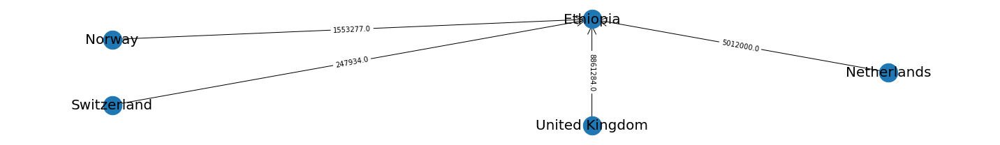

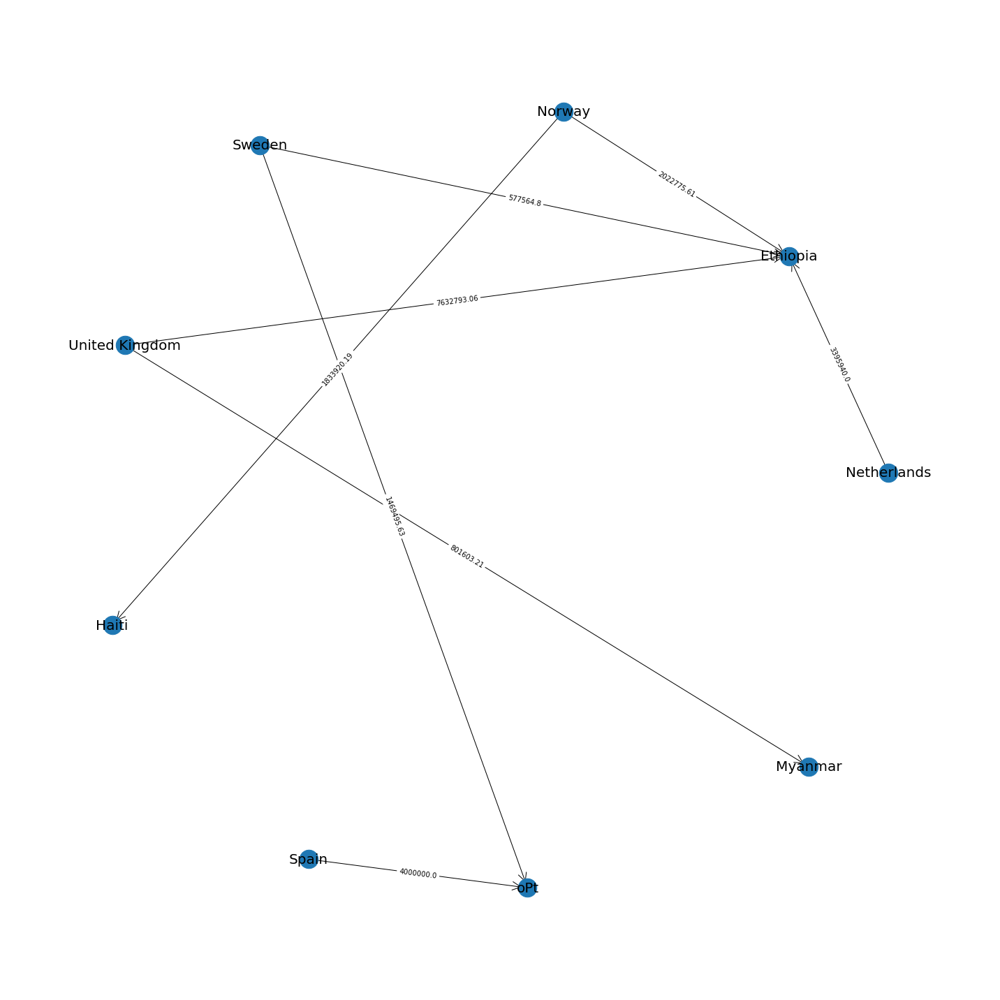

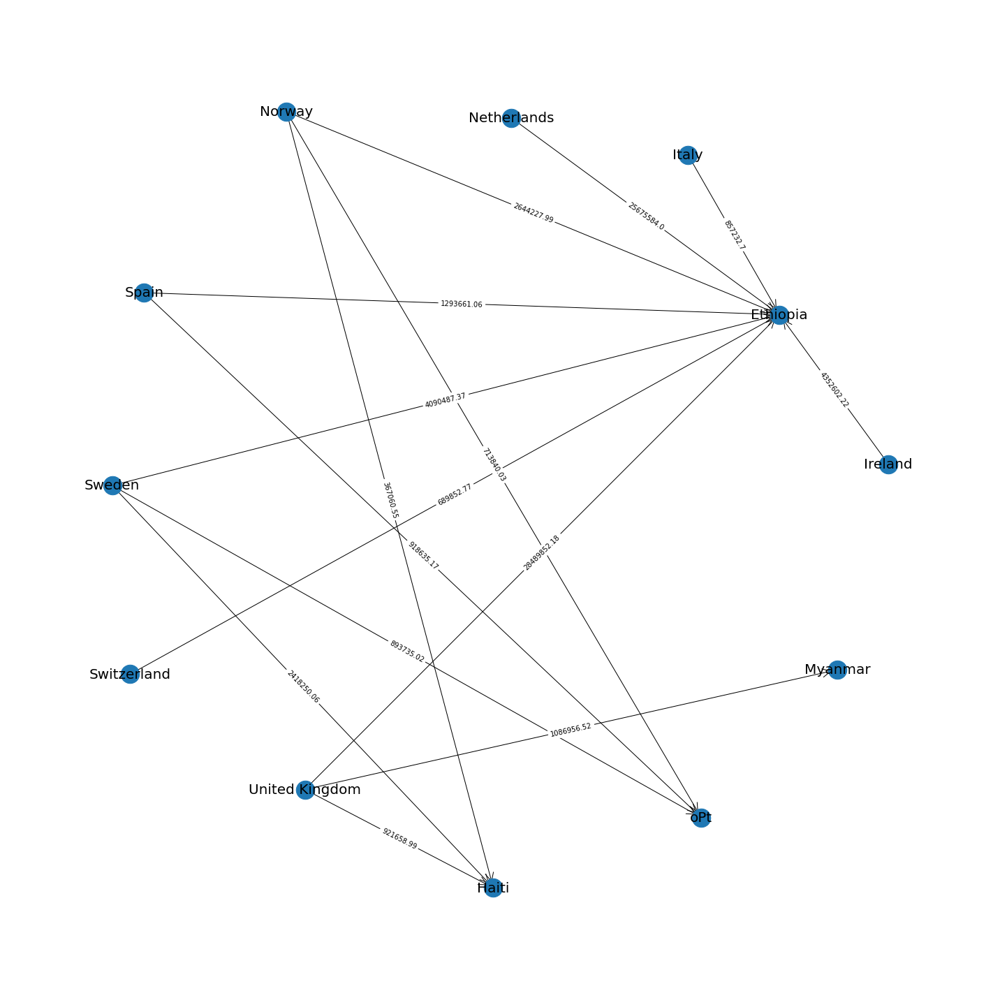

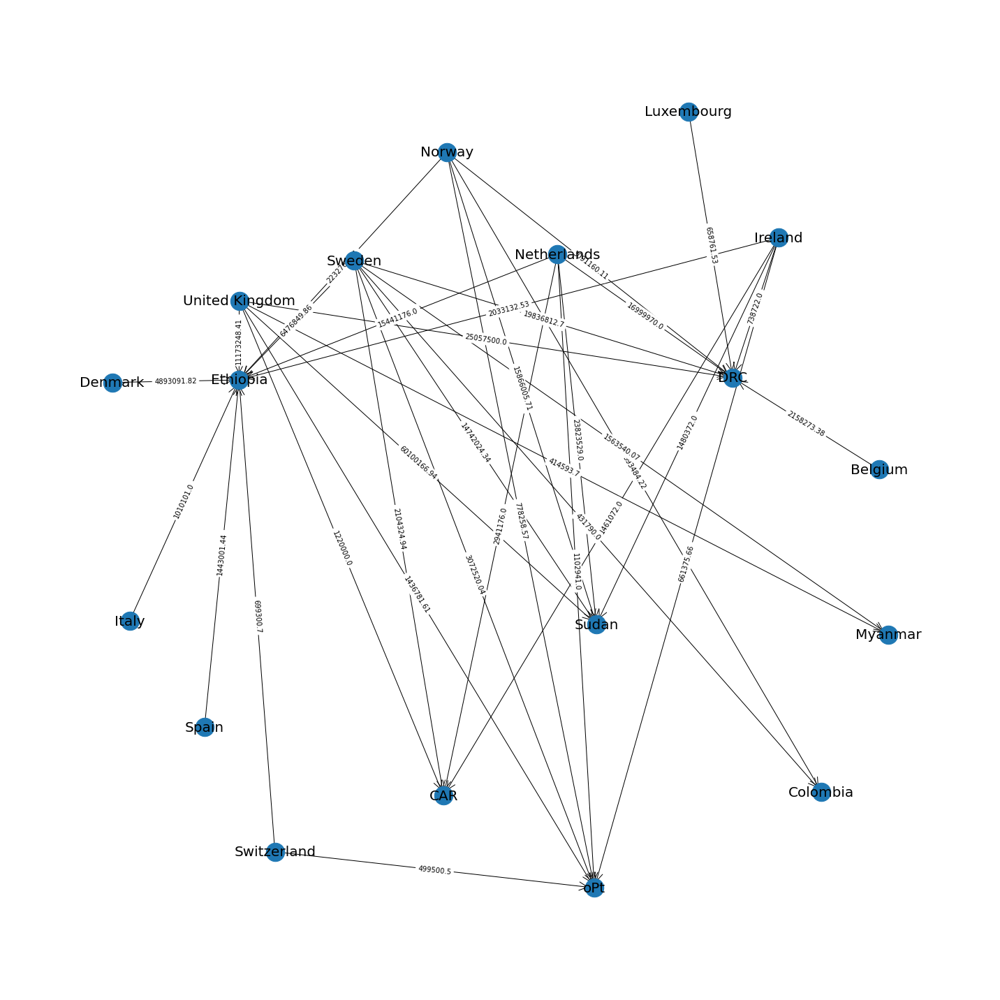

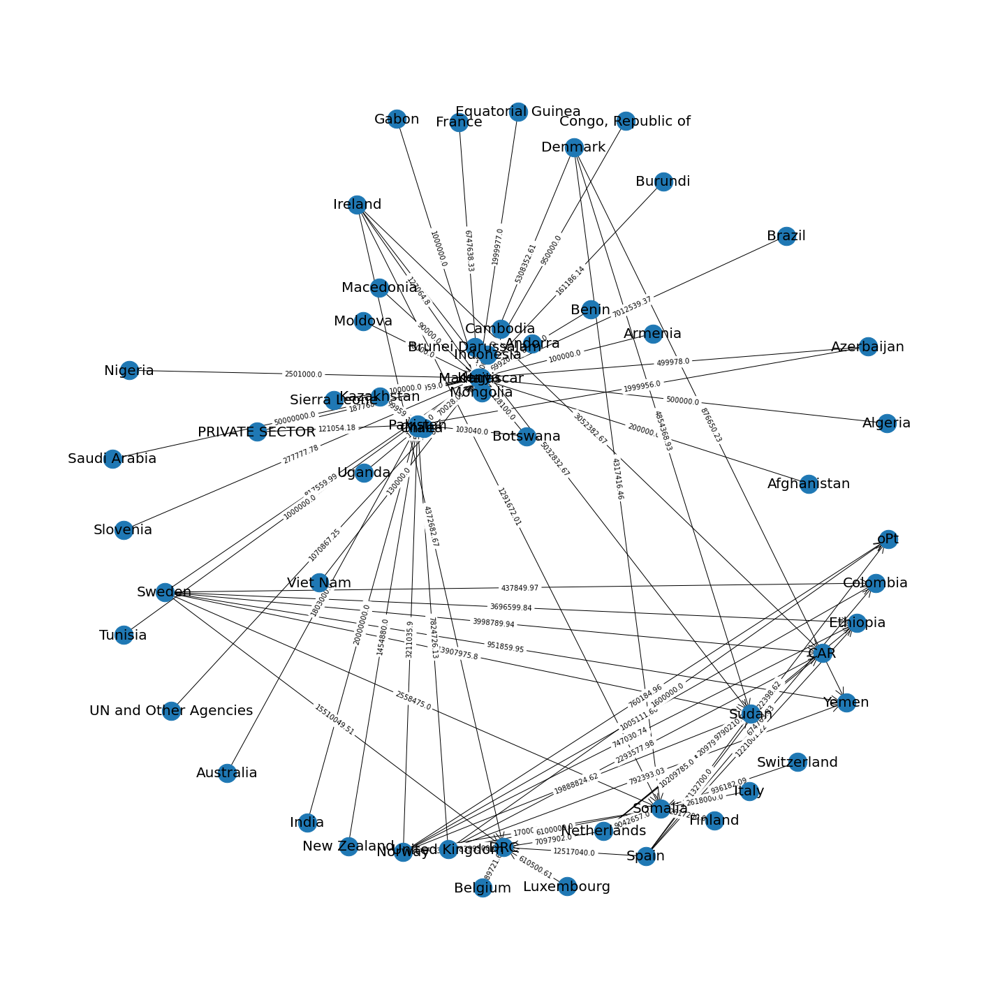

...

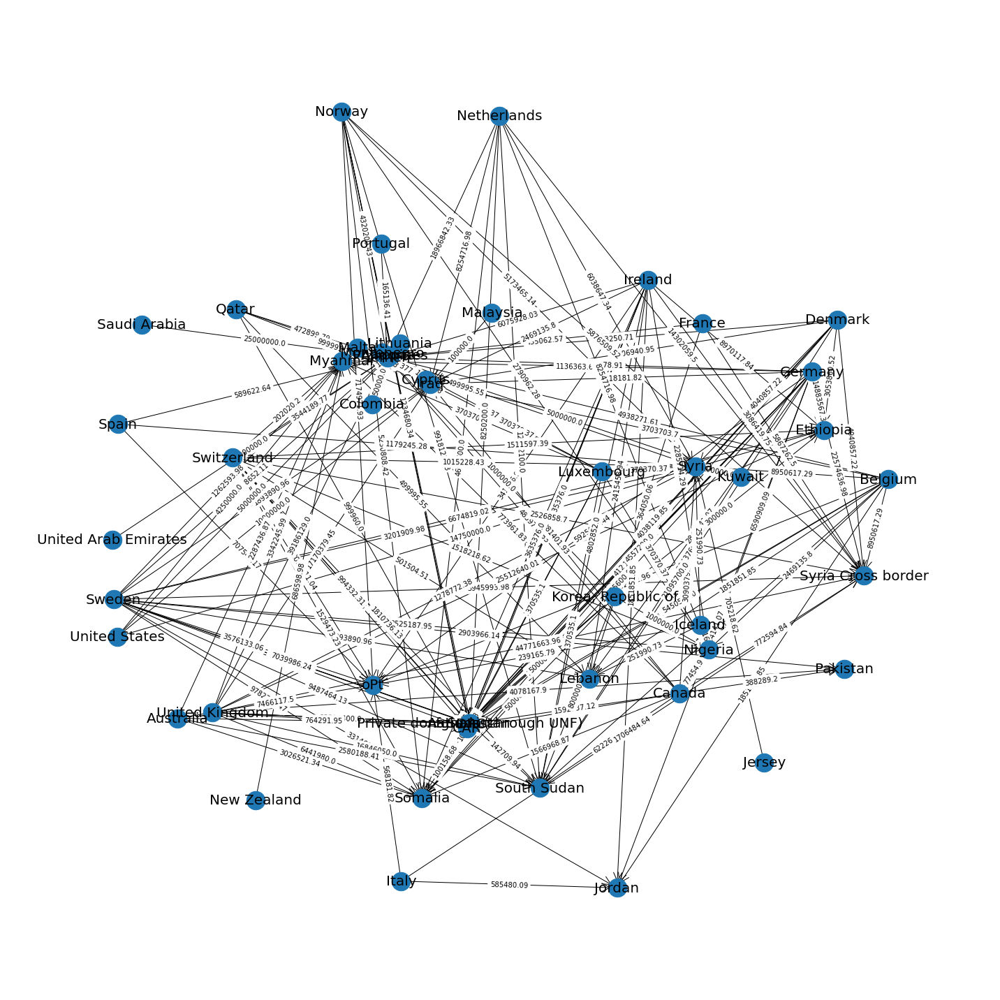

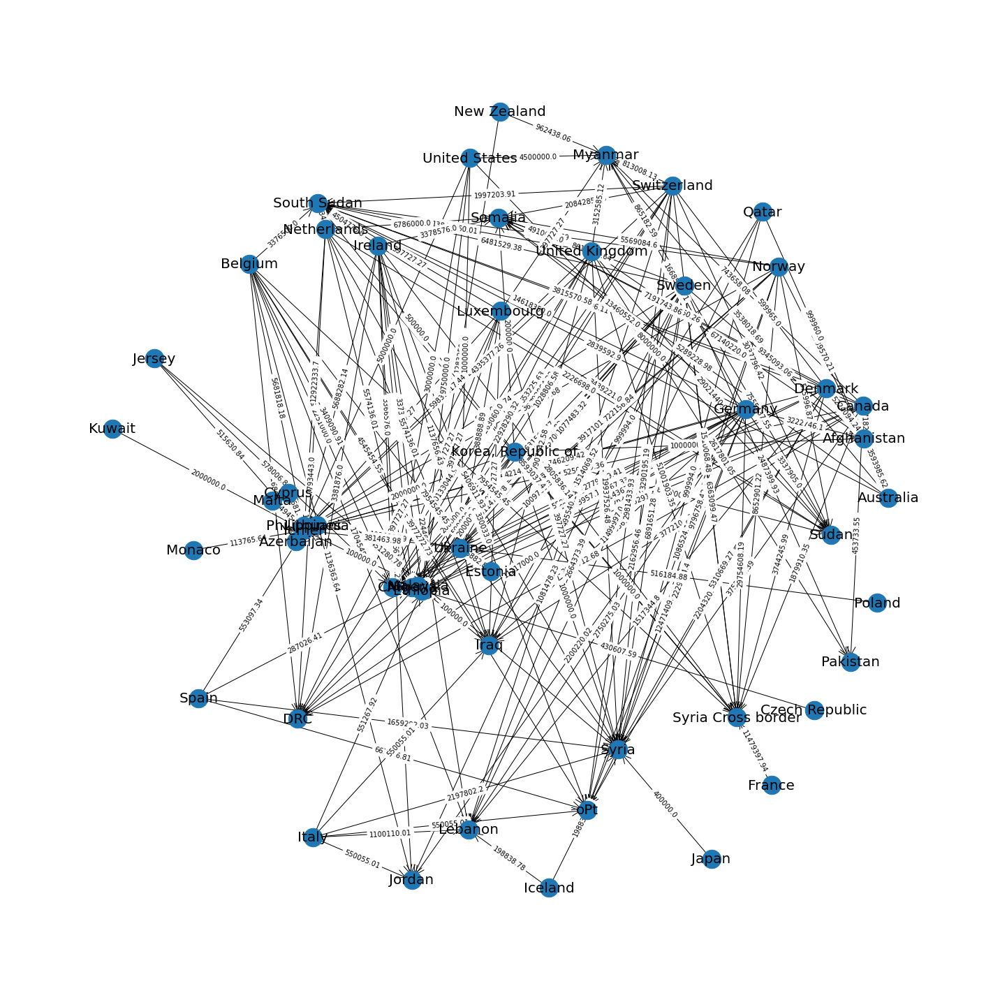

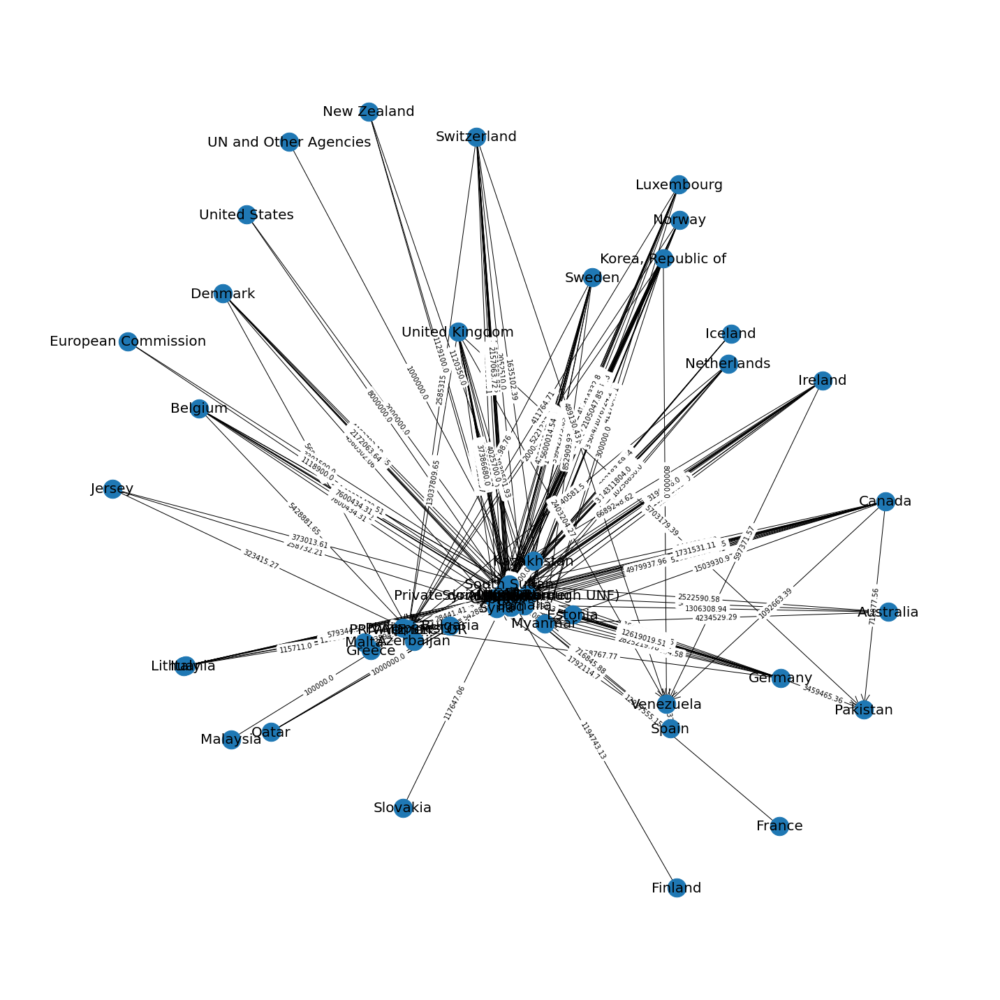

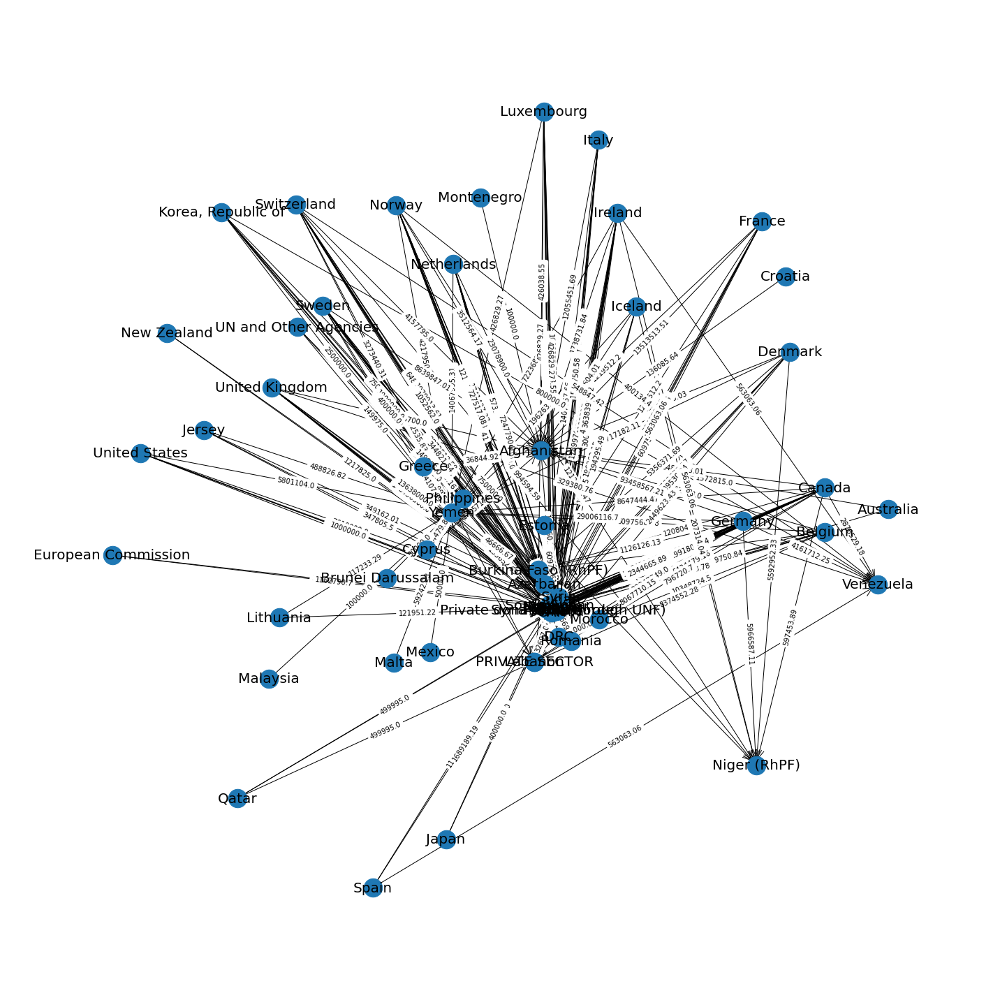

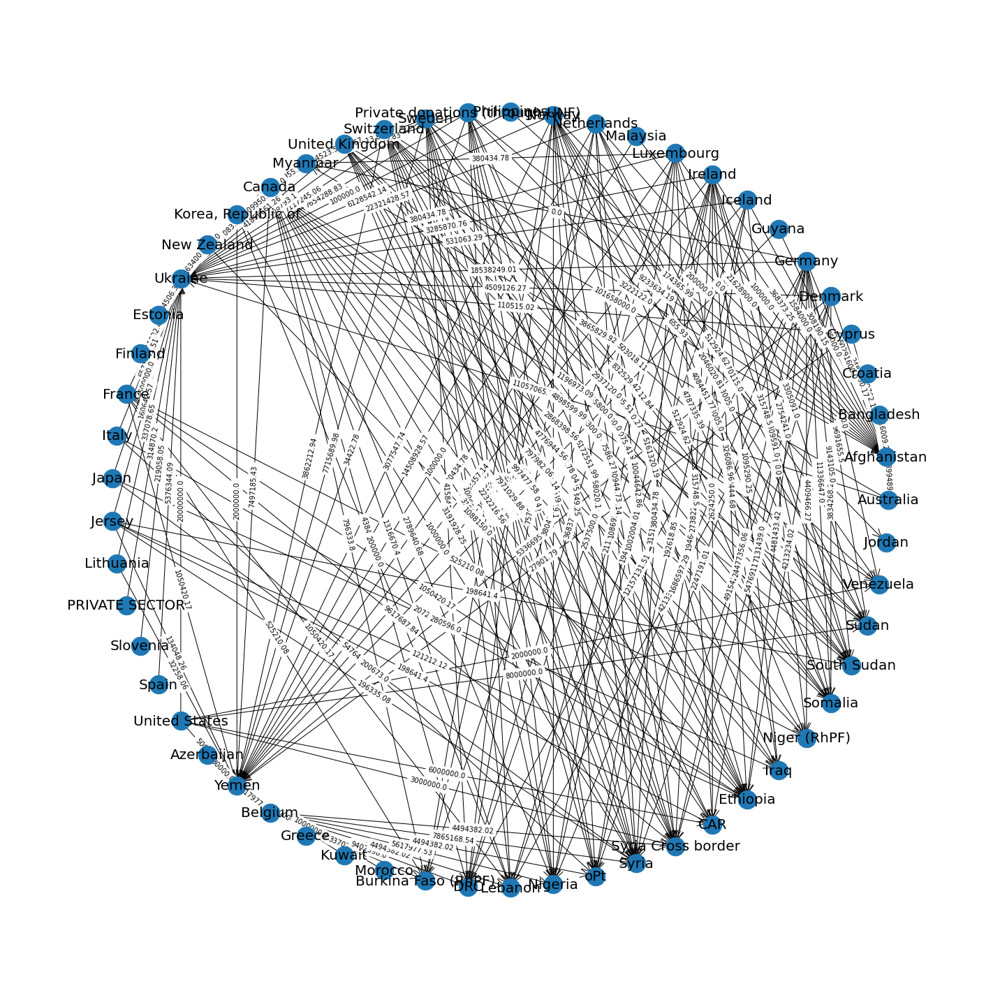

In [20]:
for year in years:
    network = network_creator(df, year)
    pass